In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import numpy as np
import pandas as pd
import os
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
# download dataset from google drive
import gdown
file_id = '1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86'
gdown.download(f'https://drive.google.com/uc?id={file_id}', 'fairface_dataset.zip', quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86
From (redirected): https://drive.google.com/uc?id=1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86&confirm=t&uuid=fab4ccc6-c537-400c-9d35-f84c5f2fae22
To: /content/fairface_dataset.zip
100%|██████████| 578M/578M [00:06<00:00, 86.9MB/s]


'fairface_dataset.zip'

In [3]:
# https://drive.google.com/file/d/1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH/view?usp=sharing # label_train
# https://drive.google.com/file/d/1wOdja-ezstMEp81tX1a-EYkFebev4h7D/view?usp=sharing # label_val
train_label_file_id = '1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH'
val_label_file_id = '1wOdja-ezstMEp81tX1a-EYkFebev4h7D'

In [4]:
gdown.download(f'https://drive.google.com/uc?id={train_label_file_id}', 'fairface_label_train.csv', quiet=False)
gdown.download(f'https://drive.google.com/uc?id={val_label_file_id}', 'fairface_label_val.csv', quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH
To: /content/fairface_label_train.csv
100%|██████████| 3.79M/3.79M [00:00<00:00, 201MB/s]
Downloading...
From: https://drive.google.com/uc?id=1wOdja-ezstMEp81tX1a-EYkFebev4h7D
To: /content/fairface_label_val.csv
100%|██████████| 448k/448k [00:00<00:00, 104MB/s]


'fairface_label_val.csv'

In [5]:
!unzip fairface_dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: val/5370.jpg            
  inflating: val/5596.jpg            
  inflating: val/5875.jpg            
  inflating: val/5878.jpg            
  inflating: val/5879.jpg            
  inflating: val/5883.jpg            
  inflating: val/6126.jpg            
  inflating: val/6132.jpg            
  inflating: val/6144.jpg            
  inflating: val/6150.jpg            
  inflating: val/6340.jpg            
  inflating: val/7190.jpg            
  inflating: val/7734.jpg            
  inflating: val/7747.jpg            
  inflating: val/7872.jpg            
  inflating: val/7940.jpg            
  inflating: val/8065.jpg            
  inflating: val/8069.jpg            
  inflating: val/8125.jpg            
  inflating: val/8202.jpg            
  inflating: val/8204.jpg            
  inflating: val/8205.jpg            
  inflating: val/8268.jpg            
  inflating: val/8270.jpg            
  inflating: val/8281.jpg            

In [6]:
label_train_data = pd.read_csv('fairface_label_train.csv')
label_train_data.head()

,file,age,gender,race,service_test
0,train/1.jpg,50-59,Male,East Asian,True
1,train/2.jpg,30-39,Female,Indian,False
2,train/3.jpg,3-9,Female,Black,False
3,train/4.jpg,20-29,Female,Indian,True
4,train/5.jpg,20-29,Female,Indian,True


In [7]:
# replace 'more than 70' in dataframe with '70+'
label_train_data['age'] = label_train_data['age'].replace('more than 70', '70+')

In [8]:
label_val_data = pd.read_csv('fairface_label_val.csv')
label_val_data.head()

,file,age,gender,race,service_test
0,val/1.jpg,3-9,Male,East Asian,False
1,val/2.jpg,50-59,Female,East Asian,True
2,val/3.jpg,30-39,Male,White,True
3,val/4.jpg,20-29,Female,Latino_Hispanic,True
4,val/5.jpg,20-29,Male,Southeast Asian,False


In [9]:
label_val_data['age'] = label_val_data['age'].replace('more than 70', '70+')

In [10]:
class FairFaceMultiTaskDataset(Dataset):
    def __init__(self, dataframe, root_dir, transform=None):
        self.annotations = dataframe
        self.root_dir = root_dir
        self.transform = transform

        # Define mappings for age and ethnicity
        self.age_mapping = {'0-2': 0, '3-9': 1, '10-19': 2, '20-29': 3, '30-39': 4, '40-49': 5, '50-59': 6, '60-69': 7, '70+': 8}
        self.ethnicity_mapping = {'White': 0, 'Black': 1, 'Latino_Hispanic': 2, 'East Asian': 3, 'Southeast Asian': 4, 'Indian': 5, 'Middle Eastern': 6}

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.annotations.iloc[idx, 0])
        image = Image.open(img_path).convert("RGB")

        # Extract labels for gender, age, and ethnicity
        gender_label = 0 if self.annotations.iloc[idx, 2] == 'Male' else 1
        age_label = self.age_mapping[self.annotations.iloc[idx, 1]]
        ethnicity_label = self.ethnicity_mapping[self.annotations.iloc[idx, 3]]

        if self.transform:
            image = self.transform(image)

        return image, (gender_label, age_label, ethnicity_label)

# Define augmentation pipeline
train_transforms = transforms.Compose([
    transforms.ToTensor(),                    # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])   # Standardize
])


val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


# Load dataset
train_dataset = FairFaceMultiTaskDataset(dataframe=label_train_data, root_dir='/content', transform=train_transforms)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataset =  FairFaceMultiTaskDataset(dataframe=label_val_data, root_dir='/content', transform=val_transform)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

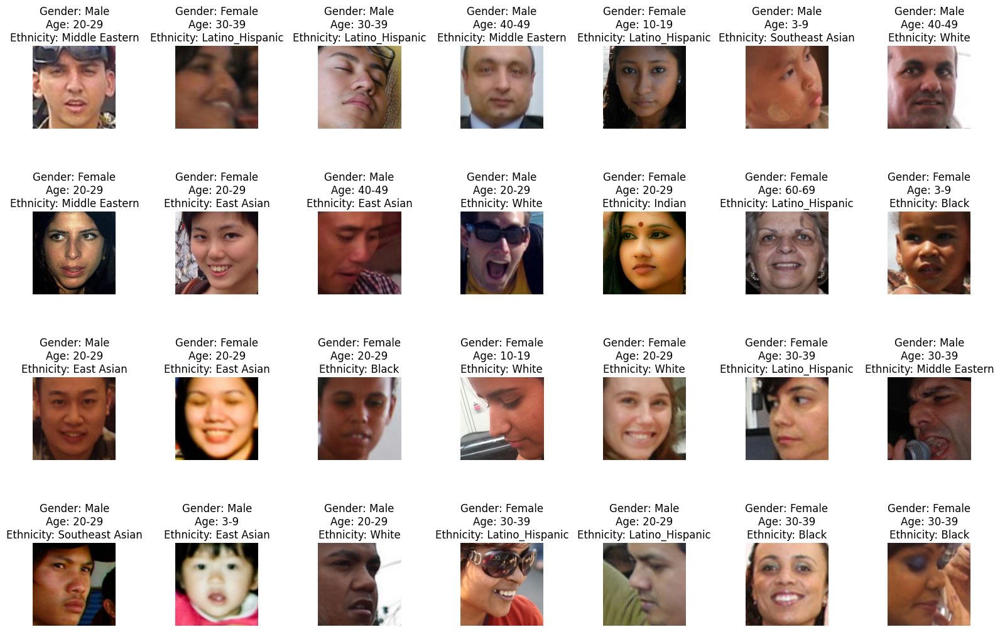

In [11]:
from torchvision.utils import make_grid

# Get a batch of training data
dataiter = iter(train_loader)
images, labels = next(dataiter)

num_images = 7 # number of images in each row
num_row = 4 # number of row
# Unnormalize the images
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
unnormalize = transforms.Normalize([-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]], [1/std[0], 1/std[1], 1/std[2]])
unnormalized_images = unnormalize(images[:num_images*num_row])


# label mappings
age_mapping = {'0-2': 0, '3-9': 1, '10-19': 2, '20-29': 3, '30-39': 4, '40-49': 5, '50-59': 6, '60-69': 7, '70+': 8}
gender_mapping = {'Male': 0, 'Female': 1}
ethnicity_mapping = {'White': 0, 'Black': 1, 'Latino_Hispanic': 2, 'East Asian': 3, 'Southeast Asian': 4, 'Indian': 5, 'Middle Eastern': 6}

# inverse label mappings
age_mapping_inv = {v: k for k, v in age_mapping.items()}
gender_mapping_inv = {v: k for k, v in gender_mapping.items()}
ethnicity_mapping_inv = {v: k for k, v in ethnicity_mapping.items()}

# Labels for the first num_images*num_row images
gender_labels = labels[0][:num_images*num_row]
age_labels = labels[1][:num_images*num_row]
ethnicity_labels = labels[2][:num_images*num_row]

# Apply inverse mapping on the labels
gender_labels = [gender_mapping_inv[label.item()] for label in labels[0][:num_images*num_row]]
age_labels = [age_mapping_inv[label.item()] for label in labels[1][:num_images*num_row]]
ethnicity_labels = [ethnicity_mapping_inv[label.item()] for label in labels[2][:num_images*num_row]]

fig, axes = plt.subplots(num_row, num_images, figsize=(20, 12))

for j in range(num_row):
    for i in range(num_images):
        axes[j, i].imshow(np.transpose(unnormalized_images[i+j*num_images].numpy(), (1, 2 ,0)))
        axes[j, i].set_title((f"Gender: {gender_labels[i+j*num_images]}\nAge: {age_labels[i+j*num_images]}\nEthnicity: {ethnicity_labels[i+j*num_images]}"))
        axes[j, i].axis('off')
        # set distance between rows
        plt.subplots_adjust(hspace=1)

for ax in axes.flat:
    ax.title.set_fontsize(12)
plt.show()

In [12]:
class MultitaskMobileNet(nn.Module):
    def __init__(self, num_gender_classes, num_age_classes, num_ethnicity_classes):
        super(MultitaskMobileNet, self).__init__()
        # Load pretrained MobileNet
        self.mobilenet = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.DEFAULT)

        # Remove the last classification layer
        self.features = self.mobilenet.features
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.last_channel = self.mobilenet.last_channel

        # Task-specific heads
        self.gender_head = nn.Linear(self.last_channel, num_gender_classes)
        self.age_head = nn.Linear(self.last_channel, num_age_classes)
        self.ethnicity_head = nn.Linear(self.last_channel, num_ethnicity_classes)

    def forward(self, x):
        # Shared feature extraction
        x = self.features(x)
        x = self.global_pool(x)
        x = torch.flatten(x, 1)

        # Task-specific outputs
        gender_out = self.gender_head(x)
        age_out = self.age_head(x)
        ethnicity_out = self.ethnicity_head(x)

        return gender_out, age_out, ethnicity_out

In [13]:
# Number of classes for each task
num_gender_classes = 2  # Male, Female
num_age_classes = 9     # Age groups (e.g., 0-2, 3-9, etc.)
num_ethnicity_classes = 7  # Ethnic groups in FairFace

# Initialize the model
model = MultitaskMobileNet(num_gender_classes, num_age_classes, num_ethnicity_classes)

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = model.to(device)


Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 57.2MB/s]


cuda


In [46]:
print(f"Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}")

Number of trainable parameters: 3527930


In [14]:
# Define loss functions for each task
criterion_gender = nn.CrossEntropyLoss()
criterion_age = nn.CrossEntropyLoss()
criterion_ethnicity = nn.CrossEntropyLoss()

# Define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


In [15]:
def evaluate(model, val_loader):
    model.eval()
    gender_correct, age_correct, ethnicity_correct = 0, 0, 0
    total = 0

    with torch.no_grad():
        for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
            images = images.to(device)
            gender_labels = gender_labels.to(device)
            age_labels = age_labels.to(device)
            ethnicity_labels = ethnicity_labels.to(device)

            gender_output, age_output, ethnicity_output = model(images)

            # Calculate accuracy for each task
            gender_correct += (gender_output.argmax(1) == gender_labels).sum().item()
            age_correct += (age_output.argmax(1) == age_labels).sum().item()
            ethnicity_correct += (ethnicity_output.argmax(1) == ethnicity_labels).sum().item()
            total += gender_labels.size(0)

    print(f"Gender Accuracy: {100 * gender_correct / total:.2f}%")
    print(f"Age Accuracy: {100 * age_correct / total:.2f}%")
    print(f"Ethnicity Accuracy: {100 * ethnicity_correct / total:.2f}%")


In [16]:
num_epochs = 10
weights = {}
losses = []
test_losses = []
losses_gender = []
losses_age = []
losses_ethnicity = []
test_losses_gender = []
test_losses_age = []
test_losses_ethnicity = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_loss_gender = 0.0
    running_loss_age = 0.0
    running_loss_ethnicity = 0.0

    batch_idx = 1
    for images, (gender_labels, age_labels, ethnicity_labels) in train_loader:
        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_labels = age_labels.to(device)
        ethnicity_labels = ethnicity_labels.to(device)

        optimizer.zero_grad()

        # Forward pass
        gender_output, age_output, ethnicity_output = model(images)

        # Compute individual losses and combine them
        gender_loss = criterion_gender(gender_output, gender_labels)
        age_loss = criterion_age(age_output, age_labels)
        ethnicity_loss = criterion_ethnicity(ethnicity_output, ethnicity_labels)

        total_loss = gender_loss + age_loss + ethnicity_loss
        total_loss.backward()
        optimizer.step()

        if batch_idx % 200 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f} \tGender Loss: {:.6f} \tAge Loss: {:.6f}\tEthnicity Loss: {:.6f}'.format(
                epoch+1, batch_idx * len(gender_labels), len(train_dataset),
                100. * batch_idx / len(train_loader), total_loss.item(),
                gender_loss.item(), age_loss.item(), ethnicity_loss.item()))
        batch_idx += 1

        running_loss += total_loss.item()
        running_loss_gender += gender_loss.item()
        running_loss_age += age_loss.item()
        running_loss_ethnicity += ethnicity_loss.item()

    losses.append(running_loss/len(train_loader))
    losses_gender.append(running_loss_gender/len(train_loader))
    losses_age.append(running_loss_age/len(train_loader))
    losses_ethnicity.append(running_loss_ethnicity/len(train_loader))

    print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {running_loss/len(train_loader):.4f}, Gender Loss: {running_loss_gender/len(train_loader):.4f}, Age Loss: {running_loss_age/len(train_loader):.4f}, Ethnicity Loss: {running_loss_ethnicity/len(train_loader):.4f}")

    running_loss = 0.0
    running_loss_gender = 0.0
    running_loss_age = 0.0
    running_loss_ethnicity = 0.0

    for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:

        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_labels = age_labels.to(device)
        ethnicity_labels = ethnicity_labels.to(device)

        gender_output, age_output, ethnicity_output = model(images)

        # Compute individual losses and combine them
        gender_loss = criterion_gender(gender_output, gender_labels)
        age_loss = criterion_age(age_output, age_labels)
        ethnicity_loss = criterion_ethnicity(ethnicity_output, ethnicity_labels)

        total_loss = gender_loss + age_loss + ethnicity_loss

        running_loss += total_loss.item()
        running_loss_gender += gender_loss.item()
        running_loss_age += age_loss.item()
        running_loss_ethnicity += ethnicity_loss.item()

    test_losses.append(running_loss/len(val_loader))
    test_losses_gender.append(running_loss_gender/len(val_loader))
    test_losses_age.append(running_loss_age/len(val_loader))
    test_losses_ethnicity.append(running_loss_ethnicity/len(val_loader))
    print(f"Epoch [{epoch+1}/{num_epochs}], Test Loss: {running_loss/len(val_loader):.4f}, Gender Loss: {running_loss_gender/len(val_loader):.4f}, Age Loss: {running_loss_age/len(val_loader):.4f}, Ethnicity Loss: {running_loss_ethnicity/len(val_loader):.4f}")

    evaluate(model, val_loader)
    weights[epoch] = model.state_dict()

    # stopping criteria
    if len(losses) > 1 and ((losses[-2] - losses[-1] < 0.01) or (test_losses[-2] < test_losses[-1])):
        print("Early stopping triggered")
        break

Train Epoch: 1 [6400/86744 (7%)]	Loss: 3.915075 	Gender Loss: 0.557619 	Age Loss: 1.648196	Ethnicity Loss: 1.709261
Train Epoch: 1 [12800/86744 (15%)]	Loss: 3.423663 	Gender Loss: 0.325442 	Age Loss: 1.668796	Ethnicity Loss: 1.429425
Train Epoch: 1 [19200/86744 (22%)]	Loss: 2.742260 	Gender Loss: 0.283286 	Age Loss: 1.212910	Ethnicity Loss: 1.246064
Train Epoch: 1 [25600/86744 (30%)]	Loss: 2.348392 	Gender Loss: 0.247460 	Age Loss: 1.116492	Ethnicity Loss: 0.984441
Train Epoch: 1 [32000/86744 (37%)]	Loss: 2.869076 	Gender Loss: 0.159066 	Age Loss: 1.503528	Ethnicity Loss: 1.206482
Train Epoch: 1 [38400/86744 (44%)]	Loss: 2.850031 	Gender Loss: 0.459929 	Age Loss: 1.192534	Ethnicity Loss: 1.197568
Train Epoch: 1 [44800/86744 (52%)]	Loss: 2.867752 	Gender Loss: 0.523132 	Age Loss: 1.233519	Ethnicity Loss: 1.111101
Train Epoch: 1 [51200/86744 (59%)]	Loss: 3.309040 	Gender Loss: 0.302844 	Age Loss: 1.755140	Ethnicity Loss: 1.251056
Train Epoch: 1 [57600/86744 (66%)]	Loss: 2.637820 	Gender 

In [17]:
# find index of minimum values in test losses
min_index = test_losses.index(min(test_losses))
print(min_index)

2


In [18]:
# load the weigts with the least loss into the model
model.load_state_dict(weights[min_index + 1])

<All keys matched successfully>

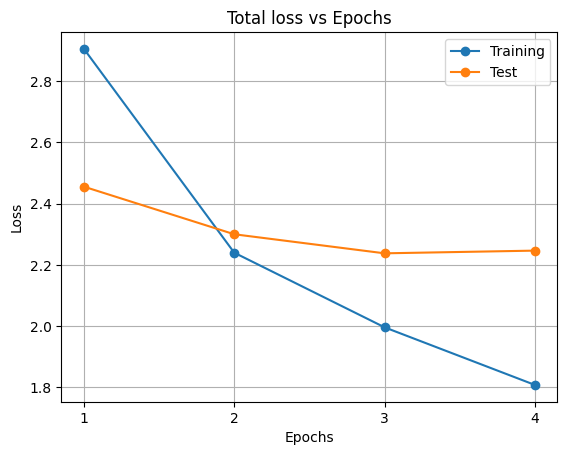

In [19]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses,marker = 'o')
plt.plot(epochs,test_losses, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(epochs)
plt.title("Total loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

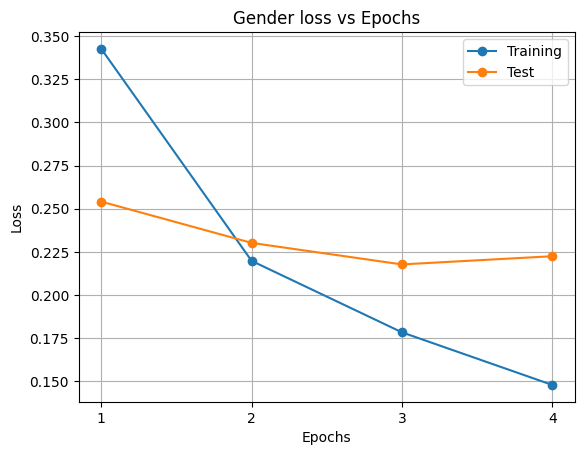

In [20]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses_gender,marker = 'o')
plt.plot(epochs,test_losses_gender, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(epochs)
plt.title("Gender loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

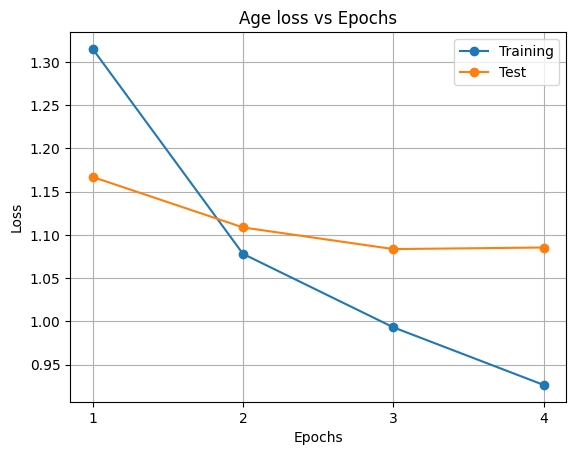

In [21]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses_age,marker = 'o')
plt.plot(epochs,test_losses_age, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(epochs)
plt.title("Age loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

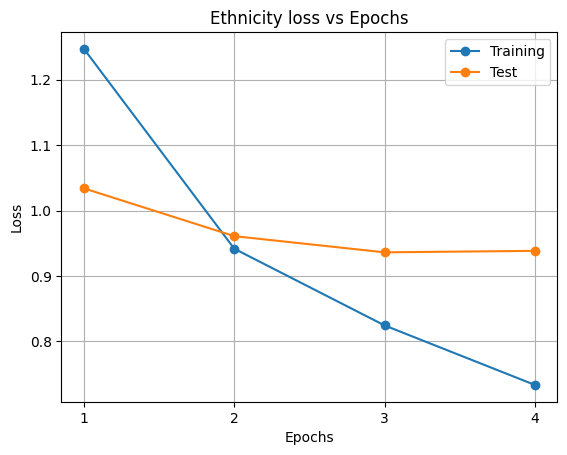

In [22]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses_ethnicity,marker = 'o')
plt.plot(epochs,test_losses_ethnicity, marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(epochs)
plt.title("Ethnicity loss vs Epochs")
plt.legend(['Training','Test'])
plt.grid('True')
plt.show()

In [23]:
# Run evaluation
evaluate(model, val_loader)

Gender Accuracy: 91.77%
Age Accuracy: 55.59%
Ethnicity Accuracy: 66.81%


In [24]:
# confusion matrix for gender, age and ethnicity prediction
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(y_true, y_pred, labels, title, ax = None):
    cm = confusion_matrix(y_true, y_pred)

    # Check if ax is provided, otherwise create a new figure
    if ax is None:
        plt.figure(figsize=(7, 5))
    else:
        # Set current axes to the provided ax
        plt.sca(ax) # Changed plt.figure() to plt.sca() to set the current axes

    # plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    # plt.show()

In [25]:
# Prediction and True values
y_true_gender = []
y_true_age = []
y_true_ethnicity = []
y_pred_gender = []
y_pred_age = []
y_pred_ethnicity = []

# Prediction and True Values given gender
y_true_age_male = []
y_true_age_female = []
y_pred_age_male = []
y_pred_age_female = []
y_true_ethnicity_male = []
y_true_ethnicity_female = []
y_pred_ethnicity_male = []
y_pred_ethnicity_female = []

model.eval()
with torch.no_grad():
    for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_labels = age_labels.to(device)
        ethnicity_labels = ethnicity_labels.to(device)

        gender_output, age_output, ethnicity_output = model(images)
        _, predicted_genders = torch.max(gender_output, 1)
        _, predicted_ages = torch.max(age_output, 1)
        _, predicted_ethnicities = torch.max(ethnicity_output, 1)
        y_true_gender.extend(gender_labels.cpu().numpy())
        y_true_age.extend(age_labels.cpu().numpy())
        y_true_ethnicity.extend(ethnicity_labels.cpu().numpy())
        y_pred_gender.extend(predicted_genders.cpu().numpy())
        y_pred_age.extend(predicted_ages.cpu().numpy())
        y_pred_ethnicity.extend(predicted_ethnicities.cpu().numpy())
        _, predicted_ages = torch.max(age_output, 1)
        y_true_age_male.extend(age_labels[gender_labels == 0].cpu().numpy())
        y_true_age_female.extend(age_labels[gender_labels == 1].cpu().numpy())
        y_pred_age_male.extend(predicted_ages[gender_labels == 0].cpu().numpy())
        y_pred_age_female.extend(predicted_ages[gender_labels == 1].cpu().numpy())
        y_true_ethnicity_male.extend(ethnicity_labels[gender_labels == 0].cpu().numpy())
        y_true_ethnicity_female.extend(ethnicity_labels[gender_labels == 1].cpu().numpy())
        y_pred_ethnicity_male.extend(predicted_ethnicities[gender_labels == 0].cpu().numpy())
        y_pred_ethnicity_female.extend(predicted_ethnicities[gender_labels == 1].cpu().numpy())

# Convert to numpy arrays
y_true_gender = np.array(y_true_gender)
y_true_age = np.array(y_true_age)
y_true_ethnicity = np.array(y_true_ethnicity)
y_pred_gender = np.array(y_pred_gender)
y_pred_age = np.array(y_pred_age)
y_pred_ethnicity = np.array(y_pred_ethnicity)
y_true_age_male = np.array(y_true_age_male)
y_true_age_female = np.array(y_true_age_female)
y_pred_age_male = np.array(y_pred_age_male)
y_pred_age_female = np.array(y_pred_age_female)
y_true_age_male = np.array(y_true_age_male)
y_true_age_female = np.array(y_true_age_female)
y_pred_age_male = np.array(y_pred_age_male)
y_pred_age_female = np.array(y_pred_age_female)


# Plot confusion matrices
age_labels = list(age_mapping.keys())
gender_labels = list(gender_mapping.keys())
ethnicity_labels = list(ethnicity_mapping.keys())


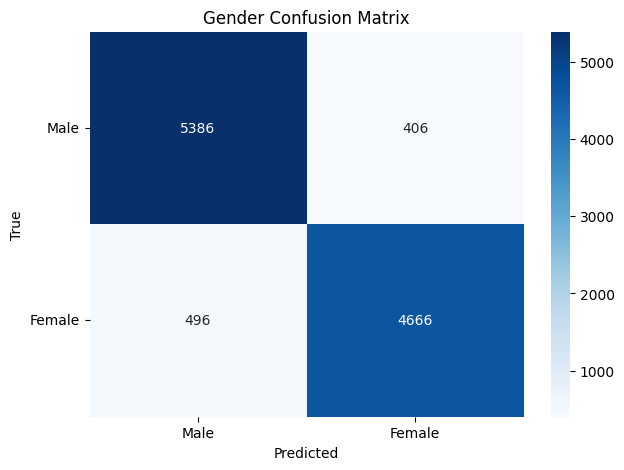

In [26]:
plot_confusion_matrix(y_true_gender, y_pred_gender, gender_labels, "Gender Confusion Matrix")
plt.yticks(rotation = 0)
plt.show()

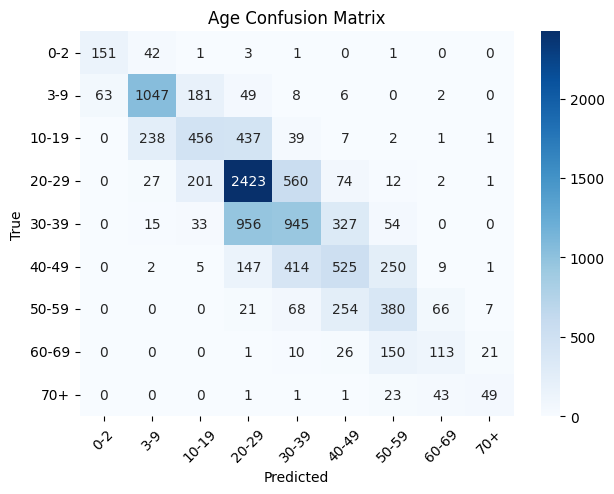

In [27]:
plot_confusion_matrix(y_true_age, y_pred_age, age_labels, "Age Confusion Matrix")
plt.yticks(rotation = 0)
plt.xticks(rotation = 45)
plt.show()

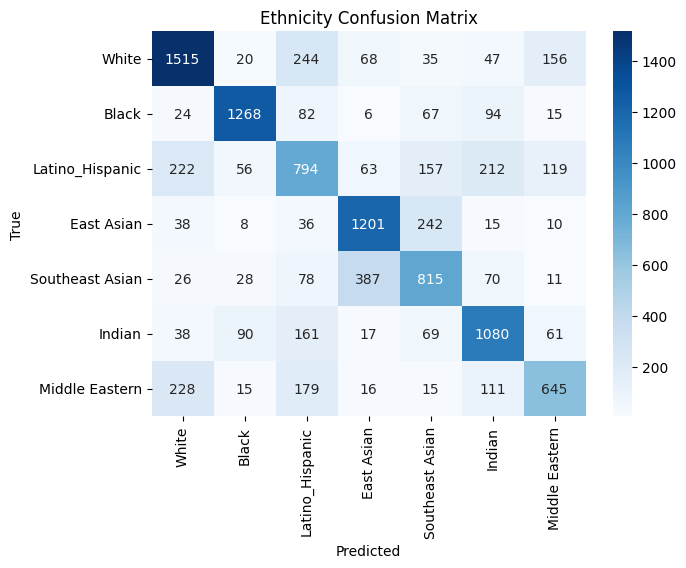

In [28]:
plot_confusion_matrix(y_true_ethnicity, y_pred_ethnicity, ethnicity_labels, "Ethnicity Confusion Matrix")

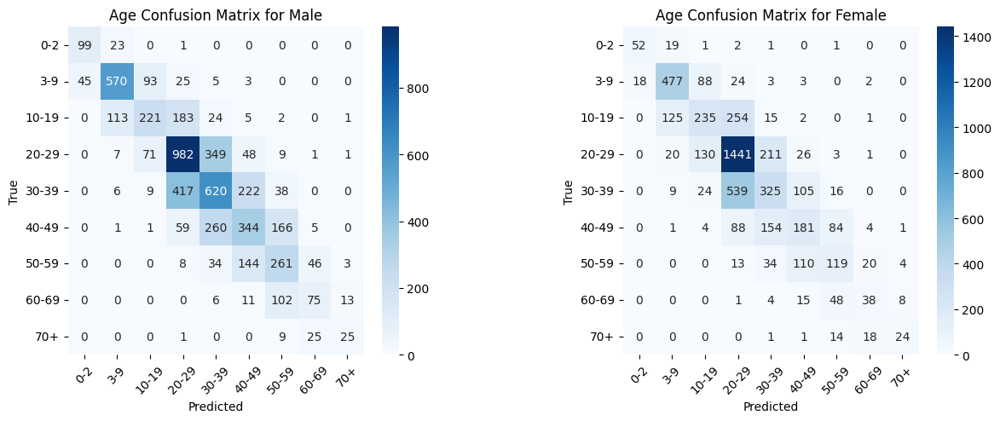

In [29]:
# plot age confusion matrices for the two gender side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
plot_confusion_matrix(y_true_age_male, y_pred_age_male, age_labels, "Age Confusion Matrix for Male", ax=axes[0])
plt.yticks(rotation = 0)
plt.xticks(rotation = 45)
plot_confusion_matrix(y_true_age_female, y_pred_age_female, age_labels, "Age Confusion Matrix for Female", ax=axes[1])
plt.subplots_adjust(wspace=0.5)
plt.yticks(rotation = 0)
plt.xticks(rotation = 45)
plt.show()

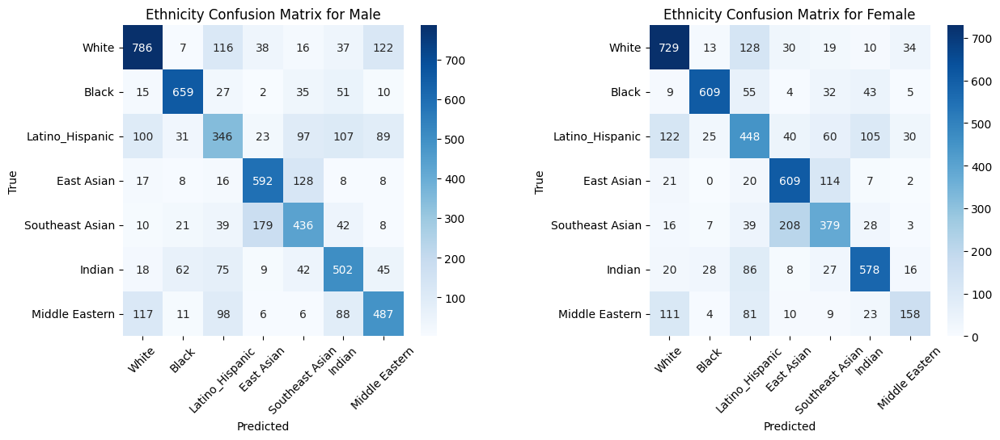

In [30]:
# plot ethnicity confusion matrices for the two genders side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
plot_confusion_matrix(y_true_ethnicity_male, y_pred_ethnicity_male, ethnicity_labels, "Ethnicity Confusion Matrix for Male", ax=axes[0])
plt.xticks(rotation = 45)
plot_confusion_matrix(y_true_ethnicity_female, y_pred_ethnicity_female, ethnicity_labels, "Ethnicity Confusion Matrix for Female", ax=axes[1])
plt.xticks(rotation = 45)
plt.subplots_adjust(wspace=0.5)
plt.show()

In [31]:
# make a dataframe storing the performance of gender detection for each ethnicity and age group
from sklearn.metrics import classification_report

# get the labels
age_labels = list(age_mapping.keys())
gender_labels = list(gender_mapping.keys())
ethnicity_labels = list(ethnicity_mapping.keys())

age_classification_report = classification_report(y_true_age, y_pred_age, target_names=age_labels)
gender_classification_report = classification_report(y_true_gender, y_pred_gender, target_names=gender_labels)
ethnicity_classification_report = classification_report(y_true_ethnicity, y_pred_ethnicity, target_names=ethnicity_labels)

print("Age Classification Report:\n", age_classification_report)
print("Gender Classification Report:\n", gender_classification_report)
print("Ethnicity Classification Report:\n", ethnicity_classification_report)


Age Classification Report:
               precision    recall  f1-score   support

         0-2       0.71      0.76      0.73       199
         3-9       0.76      0.77      0.77      1356
       10-19       0.52      0.39      0.44      1181
       20-29       0.60      0.73      0.66      3300
       30-39       0.46      0.41      0.43      2330
       40-49       0.43      0.39      0.41      1353
       50-59       0.44      0.48      0.46       796
       60-69       0.48      0.35      0.41       321
         70+       0.61      0.42      0.49       118

    accuracy                           0.56     10954
   macro avg       0.56      0.52      0.53     10954
weighted avg       0.55      0.56      0.55     10954

Gender Classification Report:
               precision    recall  f1-score   support

        Male       0.92      0.93      0.92      5792
      Female       0.92      0.90      0.91      5162

    accuracy                           0.92     10954
   macro avg      

In [32]:
gender_accuracy = {}
for age in age_labels:
    age_indices = np.where(y_true_age == age_mapping[age])
    gender_accuracy[age] = np.mean(y_true_gender[age_indices] == y_pred_gender[age_indices])
    print(f"Gender Prediction accuracy for {age}: {gender_accuracy[age]}")

Gender Prediction accuracy for 0-2: 0.7437185929648241
Gender Prediction accuracy for 3-9: 0.8259587020648967
Gender Prediction accuracy for 10-19: 0.8636748518204911
Gender Prediction accuracy for 20-29: 0.9418181818181818
Gender Prediction accuracy for 30-39: 0.9536480686695279
Gender Prediction accuracy for 40-49: 0.9549150036954915
Gender Prediction accuracy for 50-59: 0.9422110552763819
Gender Prediction accuracy for 60-69: 0.9034267912772586
Gender Prediction accuracy for 70+: 0.864406779661017


In [33]:
gender_accuracy = {}
for ethnicity in ethnicity_labels:
    ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
    gender_accuracy[ethnicity] = np.mean(y_true_gender[ethnicity_indices] == y_pred_gender[ethnicity_indices])
    print(f"Gender Prediction accuracy for {ethnicity}: {gender_accuracy[ethnicity]}")

Gender Prediction accuracy for White: 0.9218225419664269
Gender Prediction accuracy for Black: 0.8547557840616966
Gender Prediction accuracy for Latino_Hispanic: 0.9371534195933456
Gender Prediction accuracy for East Asian: 0.9135483870967742
Gender Prediction accuracy for Southeast Asian: 0.9208480565371024
Gender Prediction accuracy for Indian: 0.9261213720316622
Gender Prediction accuracy for Middle Eastern: 0.9561621174524401


In [34]:
age_accuracy = {}
for gender in gender_labels:
    gender_indices = np.where(y_true_gender == gender_mapping[gender])
    age_accuracy[gender] = np.mean(y_true_age[gender_indices] == y_pred_age[gender_indices])
    print(f"Age Prediction accuracy for {gender}: {age_accuracy[gender]}")

Age Prediction accuracy for Male: 0.5519682320441989
Age Prediction accuracy for Female: 0.5602479659046881


In [35]:
age_accuracy = {}
for ethnicity in ethnicity_labels:
    ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
    age_accuracy[ethnicity] = np.mean(y_true_age[ethnicity_indices] == y_pred_age[ethnicity_indices])
    print(f"Age Prediction accuracy for {ethnicity}: {age_accuracy[ethnicity]}")

Age Prediction accuracy for White: 0.5482014388489208
Age Prediction accuracy for Black: 0.5218508997429306
Age Prediction accuracy for Latino_Hispanic: 0.5539125077017868
Age Prediction accuracy for East Asian: 0.5916129032258064
Age Prediction accuracy for Southeast Asian: 0.5491166077738516
Age Prediction accuracy for Indian: 0.5613456464379947
Age Prediction accuracy for Middle Eastern: 0.5707196029776674


In [36]:
ethnicity_accuracy = {}
for age in age_labels:
    age_indices = np.where(y_true_age == age_mapping[age])
    ethnicity_accuracy[age] = np.mean(y_true_ethnicity[age_indices] == y_pred_ethnicity[age_indices])
    print(f"Ethnicity Prediction accuracy for {age}: {ethnicity_accuracy[age]}")

Ethnicity Prediction accuracy for 0-2: 0.6532663316582915
Ethnicity Prediction accuracy for 3-9: 0.6755162241887905
Ethnicity Prediction accuracy for 10-19: 0.6883996613039797
Ethnicity Prediction accuracy for 20-29: 0.666969696969697
Ethnicity Prediction accuracy for 30-39: 0.6652360515021459
Ethnicity Prediction accuracy for 40-49: 0.6622320768662232
Ethnicity Prediction accuracy for 50-59: 0.6633165829145728
Ethnicity Prediction accuracy for 60-69: 0.6479750778816199
Ethnicity Prediction accuracy for 70+: 0.6440677966101694


In [37]:
ethnicity_accuracy = {}
for gender in gender_labels:
    gender_indices = np.where(y_true_gender == gender_mapping[gender])
    ethnicity_accuracy[gender] = np.mean(y_true_ethnicity[gender_indices] == y_pred_ethnicity[gender_indices])
    print(f"Ethnicity Prediction accuracy for {gender}: {ethnicity_accuracy[gender]}")

Ethnicity Prediction accuracy for Male: 0.6574585635359116
Ethnicity Prediction accuracy for Female: 0.679969004261914


In [38]:
# get gender accuracy for each (age group, ethnicity group) combination
gender_accuracy = {}
for age in age_labels:
    for ethnicity in ethnicity_labels:
        age_indices = np.where(y_true_age == age_mapping[age])
        ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
        common_indices = np.intersect1d(age_indices, ethnicity_indices)
        if len(common_indices) > 0:
            gender_accuracy[(age, ethnicity)] = np.mean(y_true_gender[common_indices] == y_pred_gender[common_indices])

# print the gender accuracy for each (age group, ethnicity group) combination
for (age, ethnicity), accuracy in gender_accuracy.items():
    print(f"Gender accuracy for {age} and {ethnicity}: {accuracy}")


Gender accuracy for 0-2 and White: 0.6136363636363636
Gender accuracy for 0-2 and Black: 0.84
Gender accuracy for 0-2 and Latino_Hispanic: 0.8947368421052632
Gender accuracy for 0-2 and East Asian: 0.7755102040816326
Gender accuracy for 0-2 and Southeast Asian: 0.7058823529411765
Gender accuracy for 0-2 and Indian: 0.6666666666666666
Gender accuracy for 0-2 and Middle Eastern: 0.9
Gender accuracy for 3-9 and White: 0.8469387755102041
Gender accuracy for 3-9 and Black: 0.7421875
Gender accuracy for 3-9 and Latino_Hispanic: 0.8258426966292135
Gender accuracy for 3-9 and East Asian: 0.8590909090909091
Gender accuracy for 3-9 and Southeast Asian: 0.8985507246376812
Gender accuracy for 3-9 and Indian: 0.7978142076502732
Gender accuracy for 3-9 and Middle Eastern: 0.8275862068965517
Gender accuracy for 10-19 and White: 0.8323353293413174
Gender accuracy for 10-19 and Black: 0.7733990147783252
Gender accuracy for 10-19 and Latino_Hispanic: 0.9116279069767442
Gender accuracy for 10-19 and East

In [39]:
age_accuracy = {}
for gender in gender_labels:
    for ethnicity in ethnicity_labels:
        gender_indices = np.where(y_true_gender == gender_mapping[gender])
        ethnicity_indices = np.where(y_true_ethnicity == ethnicity_mapping[ethnicity])
        common_indices = np.intersect1d(gender_indices, ethnicity_indices)
        if len(common_indices) > 0:
            age_accuracy[(gender, ethnicity)] = np.mean(y_true_age[common_indices] == y_pred_age[common_indices])
            print(f"Age accuracy for {gender} and {ethnicity}: {age_accuracy[(gender, ethnicity)]:.4f}")

Age accuracy for Male and White: 0.5365
Age accuracy for Male and Black: 0.5457
Age accuracy for Male and Latino_Hispanic: 0.5662
Age accuracy for Male and East Asian: 0.5624
Age accuracy for Male and Southeast Asian: 0.5415
Age accuracy for Male and Indian: 0.5618
Age accuracy for Male and Middle Eastern: 0.5560
Age accuracy for Female and White: 0.5618
Age accuracy for Female and Black: 0.4967
Age accuracy for Female and Latino_Hispanic: 0.5422
Age accuracy for Female and East Asian: 0.6210
Age accuracy for Female and Southeast Asian: 0.5574
Age accuracy for Female and Indian: 0.5609
Age accuracy for Female and Middle Eastern: 0.6010


In [40]:
ethnicity_accuracy = {}
for gender in gender_labels:
    for age in age_labels:
        gender_indices = np.where(y_true_gender == gender_mapping[gender])
        age_indices = np.where(y_true_age == age_mapping[age])
        common_indices = np.intersect1d(gender_indices, age_indices)
        if len(common_indices) > 0:
            ethnicity_accuracy[(gender, age)] = np.mean(y_true_ethnicity[common_indices] == y_pred_ethnicity[common_indices])
            print(f"Ethnicity accuracy for {gender} and {age}: {ethnicity_accuracy[(gender, age)]:.4f}")

Ethnicity accuracy for Male and 0-2: 0.6504
Ethnicity accuracy for Male and 3-9: 0.6802
Ethnicity accuracy for Male and 10-19: 0.6594
Ethnicity accuracy for Male and 20-29: 0.6676
Ethnicity accuracy for Male and 30-39: 0.6562
Ethnicity accuracy for Male and 40-49: 0.6495
Ethnicity accuracy for Male and 50-59: 0.6391
Ethnicity accuracy for Male and 60-69: 0.5942
Ethnicity accuracy for Male and 70+: 0.6333
Ethnicity accuracy for Female and 0-2: 0.6579
Ethnicity accuracy for Female and 3-9: 0.6699
Ethnicity accuracy for Female and 10-19: 0.7136
Ethnicity accuracy for Female and 20-29: 0.6665
Ethnicity accuracy for Female and 30-39: 0.6768
Ethnicity accuracy for Female and 40-49: 0.6828
Ethnicity accuracy for Female and 50-59: 0.7033
Ethnicity accuracy for Female and 60-69: 0.7456
Ethnicity accuracy for Female and 70+: 0.6552


In [41]:
# calculate how often the model gets all three labels right
all_correct = 0
all_incorrect = 0
one_incorrect = 0
two_incorrect = 0

for i in range(len(y_true_gender)):
    if y_true_gender[i] == y_pred_gender[i] and y_true_age[i] == y_pred_age[i] and y_true_ethnicity[i] == y_pred_ethnicity[i]:
        all_correct += 1
    elif y_true_gender[i] != y_pred_gender[i] and y_true_age[i] != y_pred_age[i] and y_true_ethnicity[i] != y_pred_ethnicity[i]:
        all_incorrect += 1
    elif (y_true_gender[i] != y_pred_gender[i] and y_true_age[i] == y_pred_age[i] and y_true_ethnicity[i] == y_pred_ethnicity[i]) or \
       (y_true_gender[i] == y_pred_gender[i] and y_true_age[i] != y_pred_age[i] and y_true_ethnicity[i] == y_pred_ethnicity[i]) or \
       (y_true_gender[i] == y_pred_gender[i] and y_true_age[i] == y_pred_age[i] and y_true_ethnicity[i] != y_pred_ethnicity[i]):
        one_incorrect += 1
    elif (y_true_gender[i] != y_pred_gender[i] and y_true_age[i] != y_pred_age[i] and y_true_ethnicity[i] == y_pred_ethnicity[i]) or \
       (y_true_gender[i] != y_pred_gender[i] and y_true_age[i] == y_pred_age[i] and y_true_ethnicity[i] != y_pred_ethnicity[i]) or \
       (y_true_gender[i] == y_pred_gender[i] and y_true_age[i] != y_pred_age[i] and y_true_ethnicity[i] != y_pred_ethnicity[i]):
        two_incorrect += 1

print(f"All labels correct: {all_correct/len(y_true_gender):.4f}")
print(f"Two labels correct: {one_incorrect/len(y_true_gender):.4f}")
print(f"One labels correct: {two_incorrect/len(y_true_gender):.4f}")
print(f"No label correct: {all_incorrect/len(y_true_gender):.4f}")

All labels correct: 0.3408
Two labels correct: 0.4720
One labels correct: 0.1753
No label correct: 0.0120


In [42]:
# Save the model
torch.save(model.state_dict(), "multitask_mobilenet.pth")

# Load the model
model.load_state_dict(torch.load("/content/multitask_mobilenet.pth"))
model.eval()

<ipython-input-42-10c679cc3543>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/content/multitask_mobilenet.pth"))


MultitaskMobileNet(
  (mobilenet): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kerne

In [43]:
def predict_proba(model, image_path, transform, device):
    """
    Predicts the probability distribution for gender, age, and ethnicity.

    Args:
        model: The trained multi-task model.
        image_path: Path to the input image.
        transform: Image transformations.
        device: Device to run the model on.

    Returns:
        A dictionary containing the image and probability distributions for gender, age, and ethnicity.
    """

    model.eval()
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        gender_output, age_output, ethnicity_output = model(image)

    # Convert outputs to probability distributions
    gender_proba = torch.softmax(gender_output, dim=1).cpu().numpy()[0]
    age_proba = torch.softmax(age_output, dim=1).cpu().numpy()[0]
    ethnicity_proba = torch.softmax(ethnicity_output, dim=1).cpu().numpy()[0]

    return {
        'image': image_path,
        'gender_proba': gender_proba,
        'age_proba': age_proba,
        'ethnicity_proba': ethnicity_proba
    }

In [44]:
def plot_results(prediction_result, title = None):
    """Plots the image, gender, age, and ethnicity probabilities in a single row."""

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Plot the image
    image = Image.open(prediction_result['image']).convert("RGB")
    axes[0].imshow(image)
    axes[0].set_title(title)
    axes[0].axis('off')

    # Plot gender probability
    labels = ['Male', 'Female']
    axes[1].bar(labels, prediction_result['gender_proba'])
    axes[1].set_title('Gender Probability')

    # Plot age probability
    labels = ['0-2', '3-9', '10-19', '20-29', '30-39', '40-49', '50-59', '60-69', 'more than 70']
    axes[2].bar(labels, prediction_result['age_proba'])
    axes[2].tick_params(axis='x', rotation=45) # Rotate x-axis labels for better readability
    axes[2].set_title('Age Probability')

    # Plot ethnicity probability
    labels = ['White', 'Black', 'Latino_Hispanic', 'East Asian', 'Southeast Asian', 'Indian', 'Middle Eastern']
    axes[3].bar(labels, prediction_result['ethnicity_proba'])
    axes[3].tick_params(axis='x', rotation=45)  # Rotate x-axis labels
    axes[3].set_title('Ethnicity Probability')

    for ax in axes.flat:
        ax.title.set_fontsize(15)

    plt.tight_layout()  # Adjust layout to prevent overlapping titles
    plt.show()

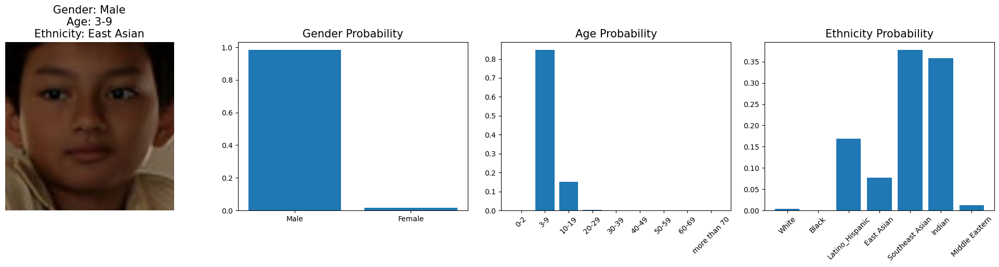

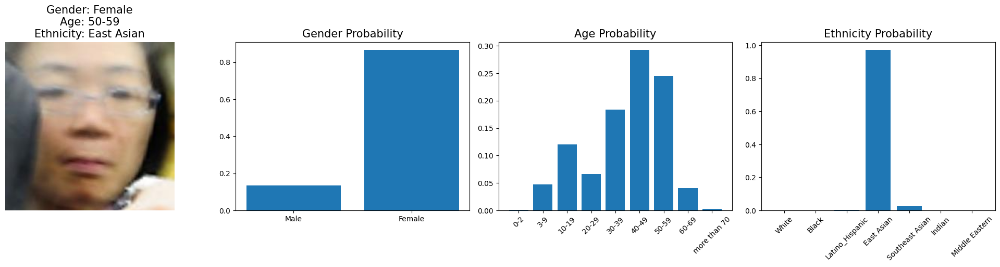

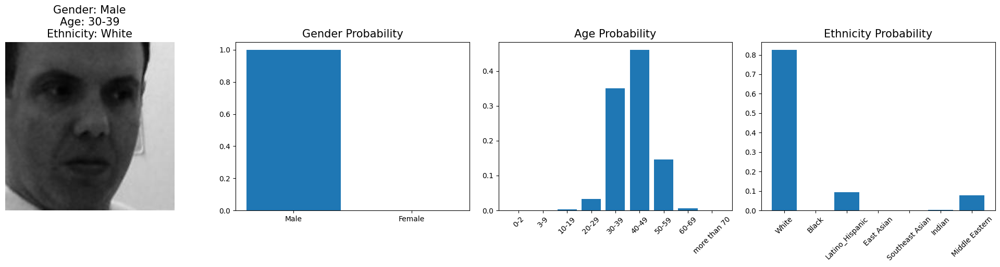

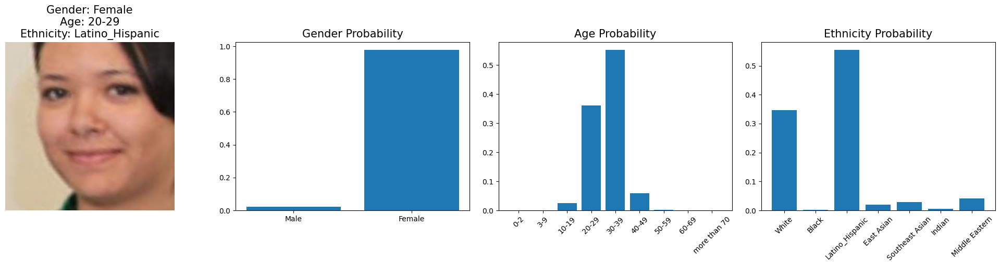

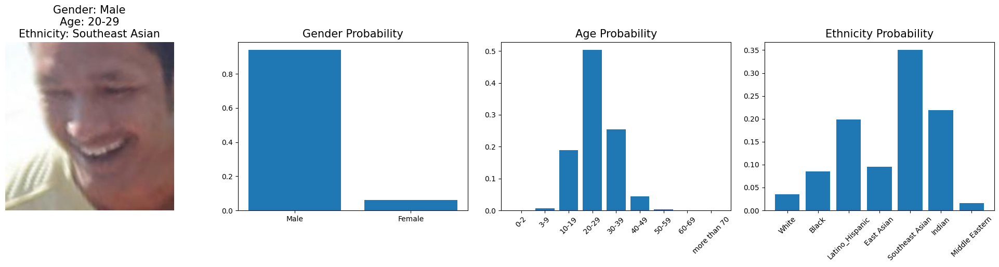

...

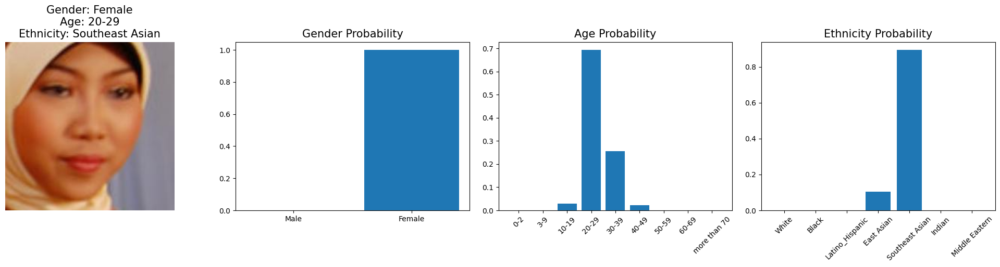

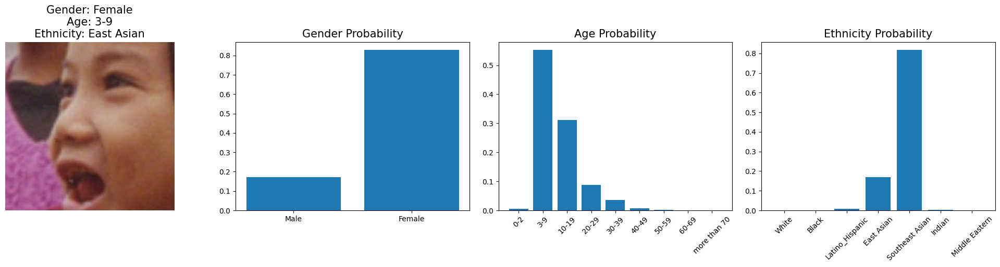

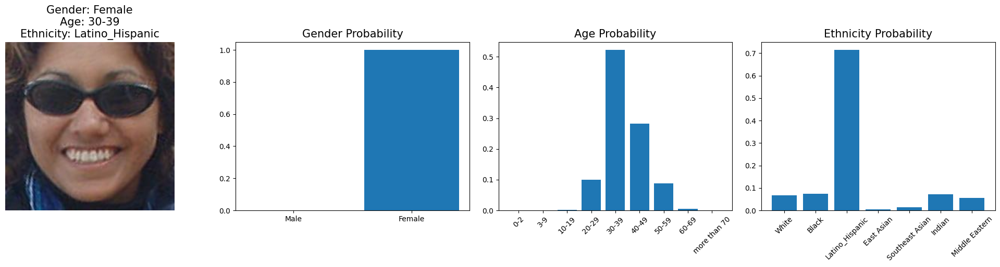

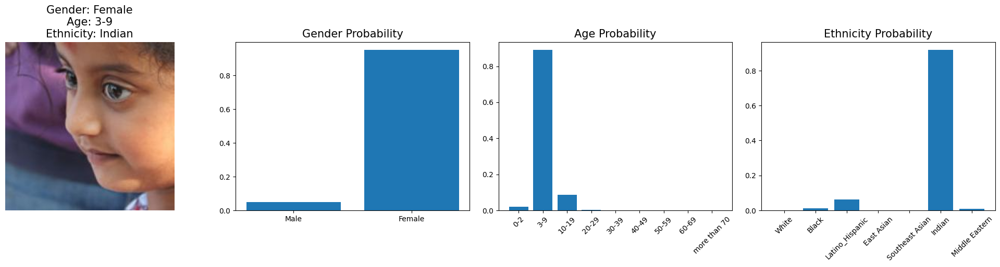

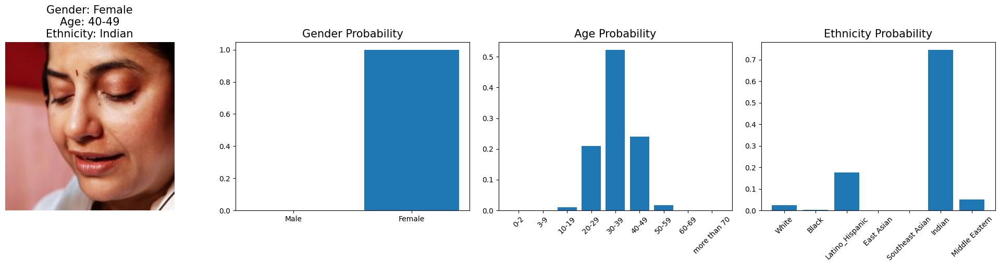

In [45]:
def show_predictions(model, val_loader, num_images=128):
    model.eval()
    with torch.no_grad():
        for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
            images = images.to(device)

            gender_labels = [gender_mapping_inv[label.item()] for label in gender_labels]
            age_labels = [age_mapping_inv[label.item()] for label in age_labels]
            ethnicity_labels = [ethnicity_mapping_inv[label.item()] for label in ethnicity_labels]
            gender_output, age_output, ethnicity_output = model(images)

            _, predicted_genders = torch.max(gender_output, 1)
            _, predicted_ages = torch.max(age_output, 1)
            _, predicted_ethnicities = torch.max(ethnicity_output, 1)

            for i in range(min(num_images, len(images))):
                # get the corresponding image from the directory
                img_path = os.path.join('/content/', val_dataset.annotations.iloc[i, 0])
                prediction_result = predict_proba(model, img_path, val_transform, device)
                plot_results(prediction_result,title = f"Gender: {gender_labels[i]}\nAge: {age_labels[i]}\nEthnicity: {ethnicity_labels[i]}")
            break

show_predictions(model, val_loader)